In [418]:
import numpy as np
import pandas as pd
from scipy.io import loadmat
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
import plotly.express as px

In [419]:
data_raw = loadmat("./data/ex7data2.mat")
X = data_raw["X"]
# y = data_raw["y"]
# data = pd.DataFrame(np.concatenate((X,y),axis=1),columns=["X1","X2","y"])

In [420]:
fig = px.scatter(x=X[:,0],y=X[:,1])
fig.show()

In [421]:
def dist(x,mu):
    return (x-mu).T@(x-mu)

def init_centroid(X,K):
    centriods = [np.random.randint(0,X.shape[0]) for _ in range(K)]
    mus = X[centriods]
    return mus

def find_closest_mu(X,mus):
    c=[]
    for x_i in X:
        dists = []
        for mu_j in mus:
            dists.append(dist(x_i,mu_j))
        c_i = np.argmin(dists)
        c.append(c_i)
    return c



In [422]:
K = 3 
mus = init_centroid(X,K)
c = find_closest_mu(X,mus)

In [423]:
mus

array([[6.33559522, 3.30864291],
       [6.99198434, 2.98706729],
       [5.63325403, 2.99002339]])

In [424]:
def update_mus(X,c,K):
    mus = []
    for k in range(K):
        mask = np.equal(c,k)
        mu = np.mean(X[mask],axis=0)
        mus.append(mu)
    return np.array(mus)



In [425]:
mus2 = update_mus(X,c,K)

In [426]:
mus2

array([[6.32981412, 3.08138183],
       [7.05086989, 2.97611699],
       [3.15927523, 2.98117601]])

In [427]:
K = 3 
mus = init_centroid(X,K)
c = find_closest_mu(X,mus)
mus_iter = []
mus_iter.append(mus)
for i in range(5):
    mus = update_mus(X,c,K)
    c = find_closest_mu(X,mus)
    mus_iter.append(mus)

    

In [428]:
k1_trace = np.array([mus_iter[i][0] for i in range(6)])
k2_trace = np.array([mus_iter[i][1] for i in range(6)])
k3_trace = np.array([mus_iter[i][2] for i in range(6)])

In [429]:
fig = px.scatter(x=X[:,0],y=X[:,1],color=c)

In [430]:
trace0 = px.line(x=k1_trace[:,0],y=k1_trace[:,1],markers=True,symbol_sequence=["cross"],color_discrete_sequence=['red']).data[0]
fig.add_trace(trace0)
trace1 = px.line(x=k2_trace[:,0],y=k2_trace[:,1],markers=True,symbol_sequence=["cross"],color_discrete_sequence=['magenta']).data[0]
fig.add_trace(trace1)
trace2 = px.line(x=k3_trace[:,0],y=k3_trace[:,1],markers=True,symbol_sequence=["cross"],color_discrete_sequence=['green']).data[0]
fig.add_trace(trace2)

In [431]:
def cost(X, mus, C):
    m = X.shape[0]

    expand_C_with_centroids = mus[C]

    distances = np.apply_along_axis(func1d=np.linalg.norm,
                                    axis=1,
                                    arr=X - expand_C_with_centroids)
    return distances.sum() / m

In [432]:
cost(X,mus,c)

0.794176363371587

# image compression

In [433]:
from skimage import io
img = io.imread('data/bird_small.png')

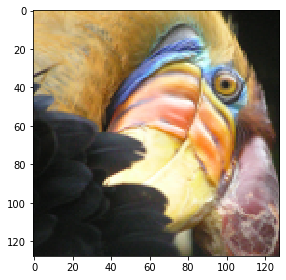

In [434]:
io.imshow(img)

In [435]:
X = img.reshape(128*128,3)

In [436]:
X.shape

(16384, 3)

In [437]:
K=16
mus = init_centroid(X,16)
c = find_closest_mu(X,mus)
mus_iter = []
mus_iter.append(mus)
for i in range(10):
    mus = update_mus(X,c,K)
    c = find_closest_mu(X,mus)
    mus_iter.append(mus)

In [438]:
np.int16(mus)

array([[227, 185, 115],
       [210, 140,  59],
       [144, 117, 110],
       [ 55,  54,  54],
       [124,  93,  54],
       [144, 180, 218],
       [192, 158,  96],
       [ 94, 110, 156],
       [246, 231, 192],
       [161, 147, 138],
       [ 24,  26,  23],
       [152, 125,  83],
       [102,  92,  90],
       [159, 114,  46],
       [ 97,  69,  49],
       [203, 180, 165]], dtype=int16)

In [439]:
compressed_pic = np.uint8(mus[c]).reshape(128,128,3)

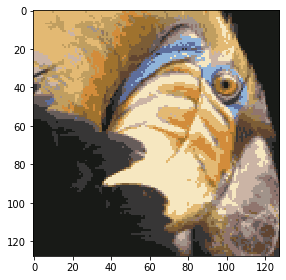

In [440]:
io.imshow(compressed_pic)

# 2D PCA

In [441]:
data_raw = loadmat("./data/ex7data1.mat")
X = data_raw["X"]
# y = data_raw["y"]
# data = pd.DataFrame(np.concatenate((X,y),axis=1),columns=["X1","X2","y"])


In [442]:
def normlizeX(X):
    return (X - np.mean(X,axis=0))/np.std(X,axis=0,ddof=1)
    

In [443]:
X = normlizeX(X)

In [444]:
fig = px.scatter(x=X[:,0],y=X[:,1])
fig.show(
)

In [445]:
sigma = (X.T@X)/X.shape[0]

In [446]:
u,s,_ = np.linalg.svd(sigma)

In [447]:
s

array([1.70081977, 0.25918023])

In [448]:
u[:,0]

array([-0.70710678, -0.70710678])

In [449]:
projection = X@u[:,0]

In [450]:
projection

array([ 1.48127391, -0.91291229,  1.21208656,  1.62734009,  1.26042409,
       -0.96700223,  1.25605967, -2.31794969, -0.02968998, -0.77386123,
       -0.62532902, -0.54724542, -0.08878025, -0.520569  ,  1.548434  ,
       -1.89684585, -0.87788459,  0.94646472, -2.30653955, -0.4731351 ,
       -2.19518524,  0.38509662, -1.76688508,  0.0512347 ,  1.64838858,
        0.5030287 , -1.2246766 , -1.16020771,  0.83375215, -0.00686207,
       -0.22565101, -1.49788781,  1.3252858 , -0.58656923,  0.67225099,
       -1.33938187,  1.67053477, -1.37836539,  2.53419743, -0.27570789,
       -0.96695982,  0.8792732 ,  1.28362916, -0.97972107,  1.79450473,
       -0.26923019,  3.16088618,  1.20080033,  0.36423084, -1.42814204])

In [451]:
reconstruction = projection.reshape(50,1)@u[:,0].reshape(2,1).T

In [452]:
reconstruction

array([[-1.04741883, -1.04741883],
       [ 0.64552647,  0.64552647],
       [-0.85707463, -0.85707463],
       [-1.15070321, -1.15070321],
       [-0.89125442, -0.89125442],
       [ 0.68377384,  0.68377384],
       [-0.88816831, -0.88816831],
       [ 1.63903794,  1.63903794],
       [ 0.02099398,  0.02099398],
       [ 0.54720252,  0.54720252],
       [ 0.44217439,  0.44217439],
       [ 0.38696095,  0.38696095],
       [ 0.06277712,  0.06277712],
       [ 0.36809787,  0.36809787],
       [-1.09490818, -1.09490818],
       [ 1.34127256,  1.34127256],
       [ 0.62075814,  0.62075814],
       [-0.66925162, -0.66925162],
       [ 1.63096976,  1.63096976],
       [ 0.33455704,  0.33455704],
       [ 1.55223037,  1.55223037],
       [-0.27230443, -0.27230443],
       [ 1.24937642,  1.24937642],
       [-0.03622841, -0.03622841],
       [-1.16558674, -1.16558674],
       [-0.355695  , -0.355695  ],
       [ 0.86597713,  0.86597713],
       [ 0.82039074,  0.82039074],
       [-0.5895518 ,

In [453]:
trace = px.scatter(x=reconstruction[:,0],y=reconstruction[:,1],color_discrete_sequence=["red"]).data[0]

In [454]:
fig.add_trace(trace)

# Face Data

In [455]:
data = loadmat('./data/ex7faces.mat')

In [456]:
data.keys()

dict_keys(['__header__', '__version__', '__globals__', 'X'])

In [457]:
X = data["X"]

In [458]:
X.shape

(5000, 1024)

In [459]:
# 前100个 排列成10*10 (320*320)

faces = [X[i].reshape(32,32).T for i in range(100)]

rows_faces = []
for row in range(10):
    rows_faces.append(np.hstack(faces[row*10:row*10+10]))

faces_img = np.vstack(rows_faces)

In [460]:
px.imshow(faces_img,color_continuous_scale="gray")

In [461]:
def demean(X):
    return X-np.mean(X,axis=0)

In [462]:
X=demean(X)

In [463]:
X

array([[-16.1258, -25.0572, -34.1592, ..., -80.5398, -79.7478, -66.8972],
       [ 29.8742,  19.9428,  10.8408, ...,  -4.5398,  23.2522,  33.1028],
       [-11.1258, -14.0572, -17.1592, ..., -80.5398, -79.7478, -78.8972],
       ...,
       [-25.1258,  -4.0572,  10.8408, ..., 120.4602, 112.2522,  92.1028],
       [ 40.8742,  36.9428,  33.8408, ...,  -8.5398,  -9.7478, -13.8972],
       [-87.1258, -86.0572, -83.1592, ...,  47.4602,  49.2522,  51.1028]])

In [464]:
sigma = X.T@X

In [465]:
u,s,_ = np.linalg.svd(sigma)

In [466]:
principal = u[:,0:36]

In [467]:
principal.shape

(1024, 36)

In [468]:
X_reduct = X@principal

In [469]:
X_reconstruct = X_reduct@principal.T

In [470]:
# 前100个 排列成10*10 (320*320)

faces = [X_reconstruct[i].reshape(32,32).T for i in range(100)]

rows_faces = []
for row in range(10):
    rows_faces.append(np.hstack(faces[row*10:row*10+10]))

faces_img = np.vstack(rows_faces)

In [471]:
px.imshow(faces_img,color_continuous_scale="gray")

In [472]:
principal = u[:,0:100]
X_reduct = X@principal

In [473]:
X_reconstruct = X_reduct@principal.T

In [474]:
# 前100个 排列成10*10 (320*320)

faces = [X_reconstruct[i].reshape(32,32).T for i in range(100)]

rows_faces = []
for row in range(10):
    rows_faces.append(np.hstack(faces[row*10:row*10+10]))

faces_img = np.vstack(rows_faces)

In [475]:
px.imshow(faces_img,color_continuous_scale="gray")

In [489]:
fig = px.scatter_3d(x=X[:,0],y=X[:,1],z=X[:,2],height=800,color=X[:,2])
fig.update_traces(marker=dict(size=1))

In [491]:
X.shape

(5000, 1024)